In [ ]:
# File uploaded by David Sierra
import numpy as np
import pandas as pd

In [2]:
from sklearn.compose import ColumnTransformer
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.experimental import enable_iterative_imputer  # noqa: F401
from sklearn.impute import IterativeImputer, SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import OneHotEncoder


def iterative_rf_impute(
    df: pd.DataFrame,
    exclude_cols=None,
    categorical_cols=None,
    numeric_cols=None,
    add_missing_indicators: bool = True,
    random_state: int = 42,
    max_iter: int = 15,
    n_estimators: int = 300,
    n_jobs: int = -1,
    verbose: int = 0,
) -> pd.DataFrame:
    """
    Imputa un DataFrame tabular con imputación iterativa usando un modelo basado en árboles (ExtraTrees ~ RF).
    - numéricas: imputación iterativa con ExtraTreesRegressor
    - categóricas: imputación simple (más frecuente) + one-hot
    Retorna DataFrame imputado con mismas columnas del input (excepto exclude_cols, que se devuelven intactas).

    Nota: La imputación iterativa funciona sobre features numéricas; por eso las categóricas se manejan aparte.
    """

    if exclude_cols is None:
        exclude_cols = []
    exclude_cols = list(exclude_cols)

    # Copia defensiva
    df_in = df.copy()

    # Separar columnas a imputar vs excluidas
    cols_to_process = [c for c in df_in.columns if c not in exclude_cols]
    df_proc = df_in[cols_to_process].copy()
    df_excl = df_in[exclude_cols].copy() if exclude_cols else None

    # Inferir tipos si no se pasan explícitos
    if categorical_cols is None and numeric_cols is None:
        # Considerar object/category/bool como categórico; lo demás numérico
        categorical_cols = df_proc.select_dtypes(
            include=["object", "category", "bool"]
        ).columns.tolist()
        numeric_cols = [c for c in df_proc.columns if c not in categorical_cols]
    elif categorical_cols is None:
        categorical_cols = [c for c in df_proc.columns if c not in numeric_cols]
    elif numeric_cols is None:
        numeric_cols = [c for c in df_proc.columns if c not in categorical_cols]

    # Asegurar que existan
    categorical_cols = [c for c in categorical_cols if c in df_proc.columns]
    numeric_cols = [c for c in numeric_cols if c in df_proc.columns]

    # --- Pipelines ---
    # Numéricas: IterativeImputer con modelo basado en árboles
    # ExtraTrees es robusto (no asume linealidad) y tolera relaciones no lineales/mixtas.
    et = ExtraTreesRegressor(
        n_estimators=n_estimators,
        random_state=random_state,
        n_jobs=n_jobs,
        min_samples_leaf=2,
    )

    num_pipe = Pipeline(
        steps=[
            (
                "imputer",
                IterativeImputer(
                    estimator=et,
                    max_iter=max_iter,
                    sample_posterior=False,
                    initial_strategy="median",
                    imputation_order="ascending",  # estable para tablas anchas
                    skip_complete=True,
                    random_state=random_state,
                    verbose=verbose,
                    add_indicator=add_missing_indicators,
                ),
            )
        ]
    )

    # Categóricas: imputar moda y luego one-hot (para no romper el flujo del ColumnTransformer)
    cat_pipe = Pipeline(
        steps=[
            (
                "imputer",
                SimpleImputer(
                    strategy="most_frequent", add_indicator=add_missing_indicators
                ),
            ),
            ("onehot", OneHotEncoder(handle_unknown="ignore", sparse_output=False)),
        ]
    )

    pre = ColumnTransformer(
        transformers=[
            ("num", num_pipe, numeric_cols),
            ("cat", cat_pipe, categorical_cols),
        ],
        remainder="drop",
        verbose_feature_names_out=False,
    )

    # Ajustar y transformar
    X = pre.fit_transform(df_proc)

    # Reconstruir nombres de columnas transformadas
    feature_names = pre.get_feature_names_out()

    X_df = pd.DataFrame(X, columns=feature_names, index=df_proc.index)

    # --- Reconstrucción del DataFrame final ---
    # Para devolver mismas columnas, imputamos numéricas directamente y para categóricas devolvemos la original imputada
    # (no la one-hot). Esto mantiene el esquema original.
    # Recuperamos imputaciones:
    #   - numéricas: salen imputadas de IterativeImputer
    #   - categóricas: imputadas por SimpleImputer (antes de one-hot)

    # Obtener numéricas imputadas (incluye indicadores si add_indicator=True)
    num_out = (
        pre.named_transformers_["num"]
        .named_steps["imputer"]
        .transform(df_proc[numeric_cols])
    )
    # Nombres de salida de numéricas (incluyendo indicadores)
    num_names = pre.named_transformers_["num"].get_feature_names_out(numeric_cols)

    num_out_df = pd.DataFrame(num_out, columns=num_names, index=df_proc.index)

    # Para categorías: aplicar SOLO el imputador (sin one-hot) para reconstruir columnas originales
    cat_imputer = pre.named_transformers_["cat"].named_steps["imputer"]
    cat_out = (
        cat_imputer.transform(df_proc[categorical_cols])
        if categorical_cols
        else np.empty((len(df_proc), 0))
    )
    cat_out_df = (
        pd.DataFrame(
            cat_out,
            columns=categorical_cols
            + list(getattr(cat_imputer, "indicator_", []).features_)
            if add_missing_indicators and categorical_cols
            else categorical_cols,
            index=df_proc.index,
        )
        if categorical_cols
        else pd.DataFrame(index=df_proc.index)
    )

    # Re-ensamblar: mismas columnas del input, imputadas cuando aplique.
    df_out = df_in.copy()

    # Numéricas: sustituir solo las columnas originales (no indicadores)
    for c in numeric_cols:
        df_out.loc[:, c] = (
            num_out_df[c].astype(df_in[c].dtype, errors="ignore")
            if c in num_out_df
            else df_out[c]
        )

    # Categóricas: sustituir columnas originales
    for c in categorical_cols:
        df_out.loc[:, c] = cat_out_df[c]

    # Excluidas quedan intactas, ya están en df_out.
    return df_out

In [3]:
dat1 = pd.read_csv("events.dat", delimiter=",")
dat2 = pd.read_csv("estations.dat", delimiter=",")
dat1

,event_date,drop,driver_type,geomagnetic_storm_level,Dst_nT,notes,primary_source,validation
0,2024-05-10,15.32,"Multiple ""cannibal"" Coronal Mass Ejections (CM...",G5,-412,Kp=9; Often referred to as the May 2024 (Mothe...,https://iopscience.iop.org/article/10.3847/153...,*
1,2024-03-24,11.47,The disturbance was caused by a full halo Coro...,G4,-130,Kp=8 (NOAA scale); unusual FD with fast recove...,https://www.swpc.noaa.gov/news/severe-g4-geoma...,*
2,2023-04-23,6.57,The storm was caused by a full-halo Coronal Ma...,G2,-213,This was the most intense geomagnetic storm s...,https://www.swpc.noaa.gov/news/g1-g2-minor-mod...,*
3,2021-11-03,9.68,"A high-velocity ""cannibal"" CME from an M7.1 fl...",G3,-117,The storm reached a maximum Kp-index of 8- and...,https://arxiv.org/abs/2212.13514,*
4,2017-09-07,6.41,This event was driven by the strongest flare o...,G4,-144,Reported as G4 severe storm; Dstmin listed as ...,https://iopscience.iop.org/article/10.3847/153...,*
5,2015-06-22,8.57,A series of five halo or partial-halo CMEs rea...,G4,-198,Often called the 2015 Summer Solstice Storm; D...,https://link.springer.com/article/10.1007/s112...,*
6,2012-07-14,6.70,An X1.4 solar flare from Active Region 1520 la...,G4,-139,Reached a G4 (Severe) level with a minimum Dst...,https://link.springer.com/article/10.1007/s112...,*
7,2012-03-08,10.40,This event was driven by a pair of powerful er...,G3/G4,-148,Global Total Electron Content (TEC) variations...,https://www.frontiersin.org/journals/astronomy...,*
8,2011-10-24,6.01,A magnetic filament eruption around 01:00 UT o...,G3,-137,"The CME contained a ""knot"" of southward-pointi...",https://www.spaceweather.live/en/archive/2011/...,*
9,2006-12-14,9.29,An X3.8-class solar flare from Active Region 9...,G4,-146,This occurred during Solar Minimum surprising ...,https://link.springer.com/article/10.1134/S001...,*


In [4]:
dat2

,code,station_name,rigidity_GV,altitude_m,lat_N,long_E
0,AATA,Alma-Ata A,5.90,897.0,NaN,NaN
1,AATB,Alma-Ata B,5.90,3340.0,NaN,NaN
2,AHMD,Ahmedabad,15.94,50.0,23.0100,72.6100
3,APTY,Apatity,0.65,181.0,67.5704,33.3935
4,ARNM,Aragats,7.10,3200.0,40.4667,44.1667
...,...,...,...,...,...,...
60,TSMB,Tsumeb,9.15,1240.0,-19.2000,17.5800
61,TXBY,Tixie Bay,0.48,0.0,NaN,NaN
62,UFSZ,Zugspitze,4.10,2650.0,NaN,NaN
63,YKTK,Yakutsk,1.65,105.0,61.9891,129.6970


/home/neno/.local/lib/python3.13/site-packages/sklearn/impute/_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(
/home/neno/.local/lib/python3.13/site-packages/pandas/plotting/_matplotlib/core.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


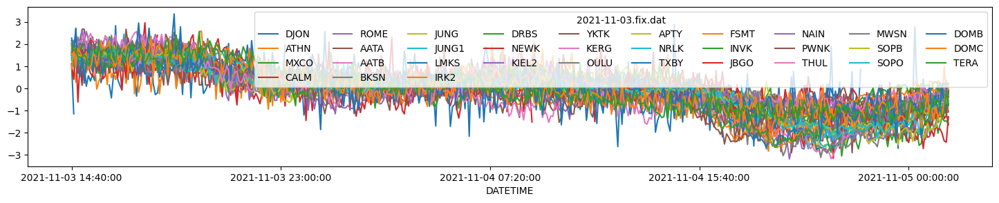

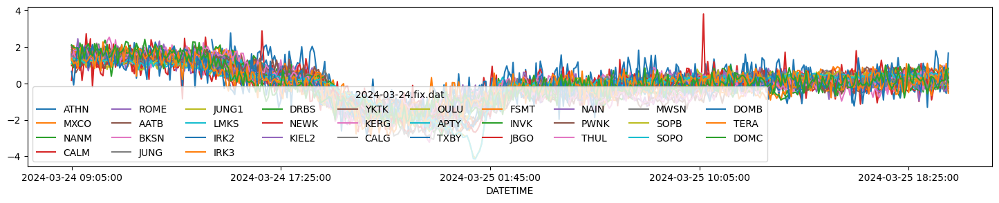

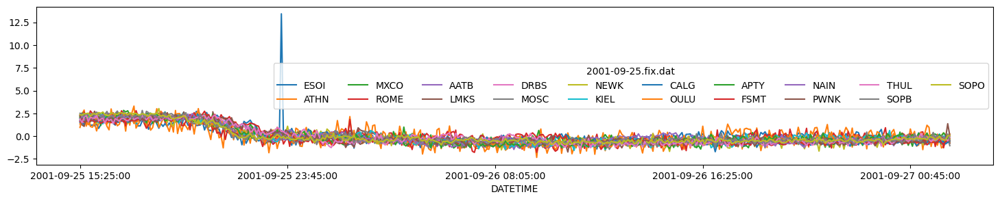

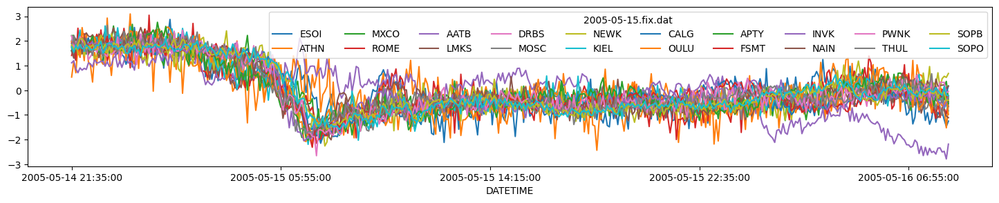

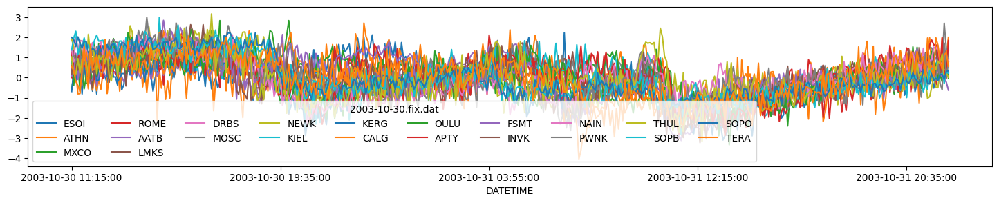

...

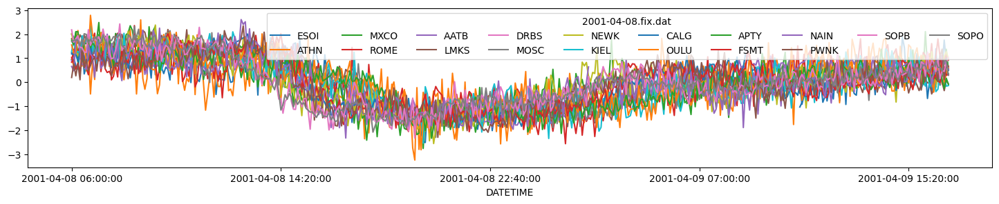

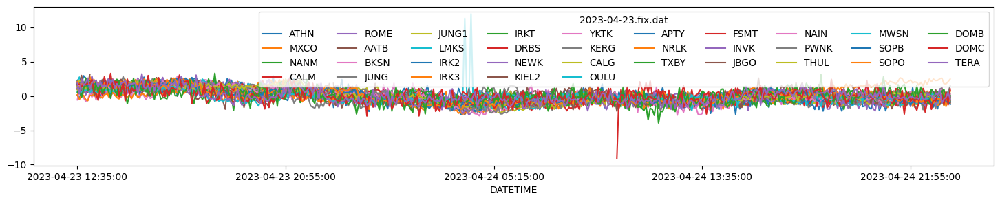

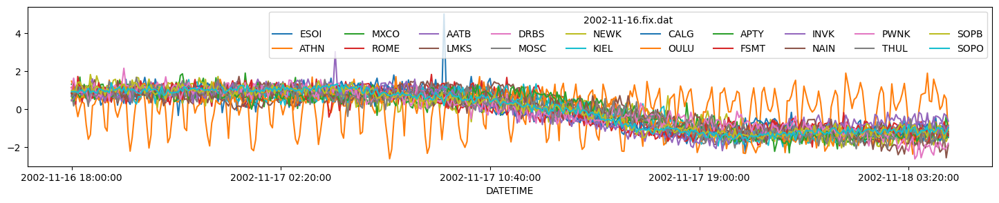

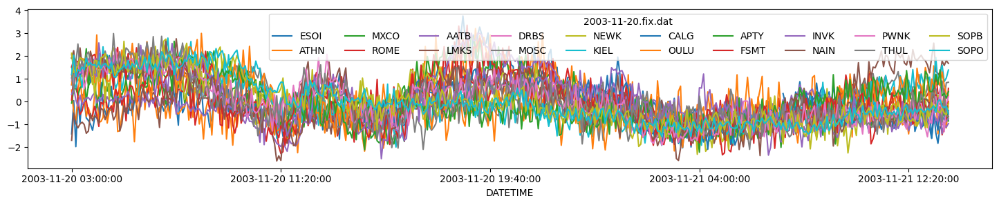

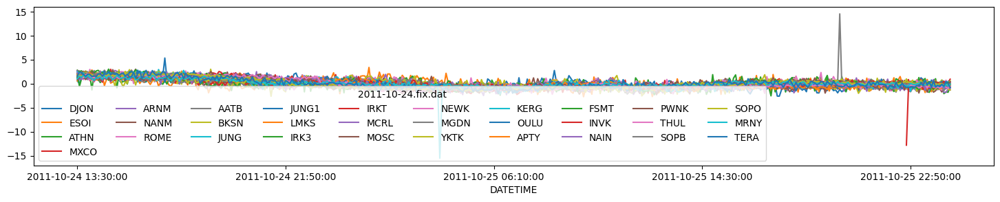

In [5]:
import glob

import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
for i in glob.glob("20*.fix.dat"):
    # print(i)
    a = pd.read_csv(i, delimiter=",")
    a.set_index("DATETIME", inplace=True)
    standard_a = scaler.fit_transform(a)
    standard_a = pd.DataFrame(standard_a, columns=a.columns, index=a.index)
    a_imp = iterative_rf_impute(
        a, add_missing_indicators=True, max_iter=20, n_estimators=400, random_state=7
    )
    a_imp.to_csv(i.split(".fix.dat")[0] + "imp.fix.dat")
    # a.plot(figsize=(18,3))
    standard_a.plot(figsize=(18, 3))
    plt.legend(ncol=10, title=i)

/home/neno/.local/lib/python3.13/site-packages/pandas/plotting/_matplotlib/core.py:580: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = self.plt.figure(figsize=self.figsize)


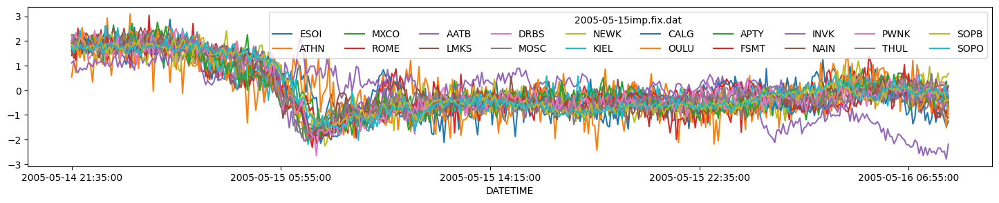

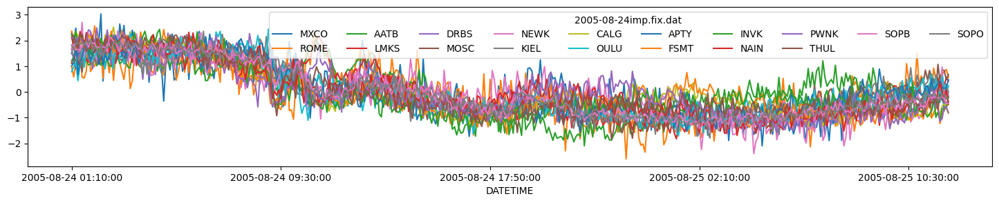

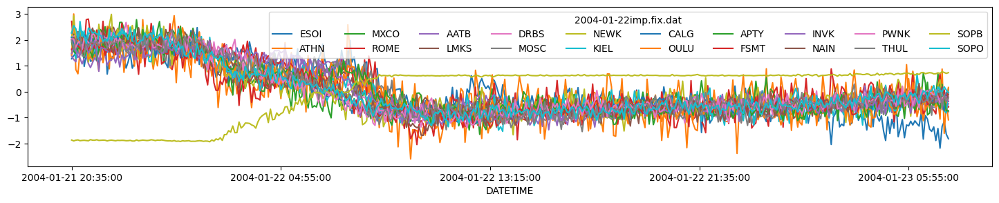

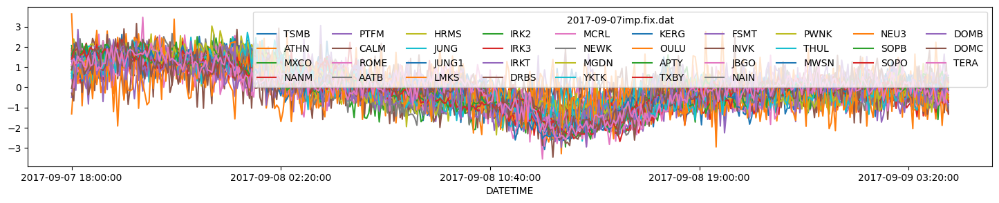

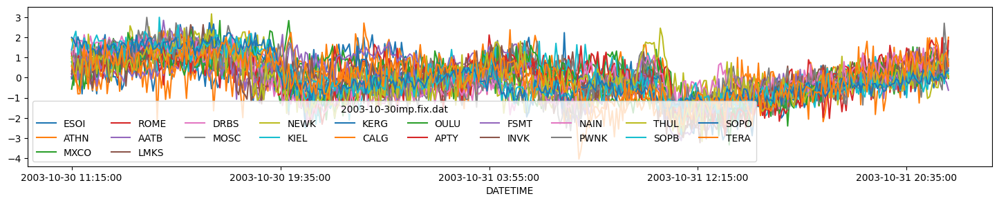

...

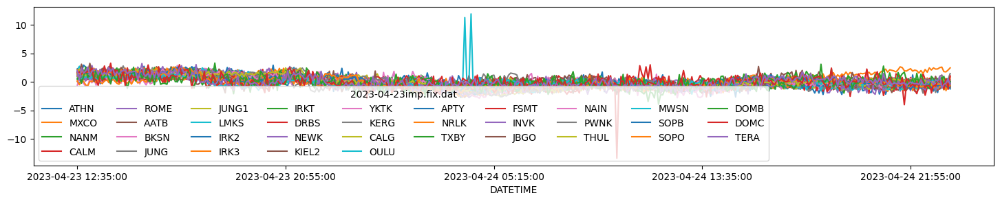

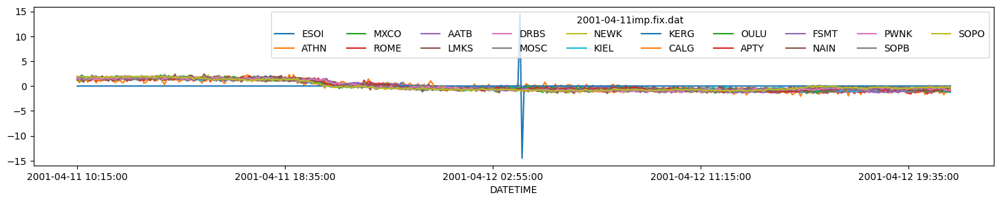

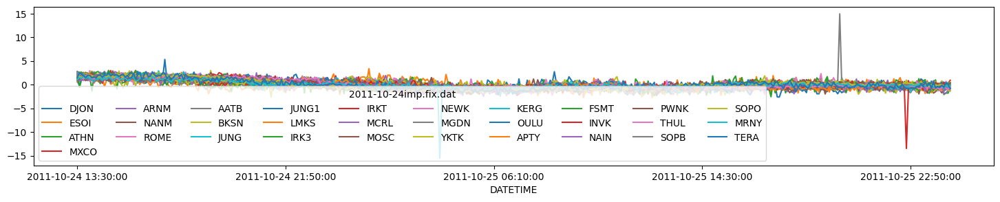

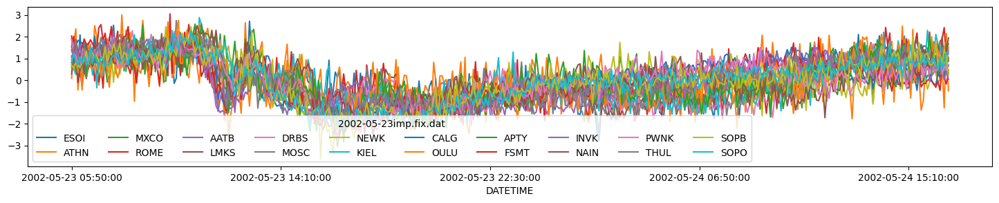

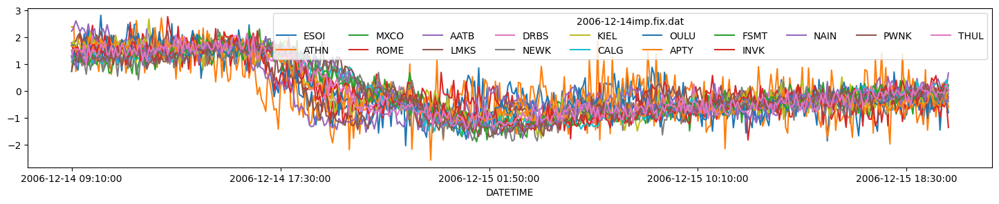

In [7]:
for i in glob.glob("20*imp.fix.dat"):
    # print(i)
    a = pd.read_csv(i, delimiter=",")
    a.set_index("DATETIME", inplace=True)
    standard_a = scaler.fit_transform(a)
    standard_a = pd.DataFrame(standard_a, columns=a.columns, index=a.index)
    standard_a.plot(figsize=(18, 3))
    plt.legend(ncol=10, title=i)